# Basic Graph Analysis


Graphs are described using basic and graph theoretical measures. Distribution of measures across the dataset are plotted.



In [60]:
import warnings
warnings.filterwarnings("ignore")
import glob
import os
import os.path as op
import sys
sys.path.append(
    '/Users/CN/Documents/Projects/Cambridge/cambridge_language_analysis/')

# Plotting
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

# Data Processing
import numpy as np
import pandas as pd
import datetime
import re
# import gensim
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import collections
import networkx as nx

# Statistics
import scipy


In [61]:
# SemanticSpeechGraph functions
from compile_graphs_dataset import get_graphs, graph_properties, exclude_empty_graphs
from graph_analysis_functions import print_bidirectional_edges, print_parallel_edges, get_parallel_edges
from word_embedding_analysis import central_words

In [62]:
# --------------------- Import graphs ---------------------------------------
graph_dir = '/Users/CN/Dropbox/speech_graphs/oasis'
output_figures = op.join(graph_dir, 'figures')

graphs, filelist = get_graphs(graph_dir)
graphs, filelist = exclude_empty_graphs(graphs, filelist, be_quiet=True)



Obtained 423 graphs. Excluded 0 empty graphs. Kept 423 graphs.


In [73]:
# --------------------- Import graph data ---------------------------------------
df = pd.read_csv(op.join(graph_dir, 'output/graph_data.csv'))
print('Described {0} graphs.\n{1} subjects described {2} ± {3} pictures.'.format(df.shape[0], len(df.subj.unique()), round(df.subj.value_counts().mean(),2), round(df.subj.value_counts().std(),2)))


# Make subj and tat categorical
df.subj = pd.Categorical(df.subj.astype('str'))
df.tat = pd.Categorical(df.tat.astype('str'))


id_data = pd.read_csv('/Users/CN/Documents/Projects/Cambridge/data/oasis/ids_oasis.csv', delimiter=';')
df['group'] = np.nan
for s, subj in enumerate(id_data.Subject):
    df.at[df.subj == str(subj), 'group'] = id_data.Group[s]

df.group = pd.Categorical(df.group.astype('str'))
df.group = df.group.cat.rename_categories({'ARMS': 'CHR'})

df.group = df.group.cat.reorder_categories(
    ['CON', 'CHR', 'FEP'])


print('--- Groups ---\n{}'.format(df.group.value_counts()))

Described 423 graphs.
53 subjects described 7.98 ± 0.14 pictures.
--- Groups ---
CHR    191
FEP    128
CON    104
Name: group, dtype: int64


In [80]:
# Exclude subject 12 because of bad quality transcripts
df.shape
df = df[df.subj.values != '12']


In [103]:
# Calculate additional measures
df['inverse_nodes'] = 1/df.nodes
df['max_degree_centrality_abs'] = df.max_degree_centrality*df.nodes
df['max_indegree_centrality_abs'] = df.max_indegree_centrality_value*df.nodes
df['max_outdegree_centrality_abs'] = df.max_outdegree_centrality_value*df.nodes

In [81]:
# --------------------- Average across TAT stimuli ( = one datapoint per participant ) ---------------------------------------
df['group_n'] = None
df.group_n = df.group.cat.codes*100
oasis_avg = (df.groupby((df.subj != df.subj.shift()).cumsum())
                  .mean()
                  .reset_index(drop=True))

# oasis_avg.group_n.value_counts()
# oasis_avg['group'] = oasis_avg.group_n.astype("category")
oasis_avg['group'] = pd.Categorical(oasis_avg.group_n)

oasis_avg.group = oasis_avg.group.cat.rename_categories({0: 'CON', -56: 'FEP', 100: 'CHR'})
oasis_avg.group.cat.reorder_categories(
    ['CON', 'CHR', 'FEP'], inplace=True)
oasis_avg.group.value_counts()


CHR    24
FEP    16
CON    12
Name: group, dtype: int64

In [17]:
oasis_avg.columns

Index(['Unnamed: 0', 'words', 'sentences', 'nodes', 'edges', 'unconnected',
       'average_total_degree', 'parallel_edges', 'bidirectional_edges', 'lsc',
       'lcc', 'L1', 'L2', 'L3', 'cc_size_mean', 'cc_size_med', 'cc_size_sd',
       'cc_size_max', 'connected_components', 'max_degree_centrality',
       'max_indegree_centrality_value', 'max_outdegree_centrality_value',
       'mean_sentence_length', 'mean_confidence', 'std_confidence', 'density',
       'diameter', 'average_shortest_path', 'clustering', 'consecutive_edges',
       'distance', 'distance_mean', 'distance_median', 'distance_std',
       'distance_2edge_mean', 'distance_2edge_median', 'distance_2edge_std',
       'group_n', 'group'],
      dtype='object')

In [18]:
# ----------- How many parallel edges? -----------
print('{0:f} % have at least one parallel edge. Mean number of parallel edges that are parallel in those: {1:f}'.format(
    len(df[df.parallel_edges > 0]) / len(df) * 100, df[df.parallel_edges > 0].parallel_edges.mean()))

40.661939 % have at least one parallel edge. Mean number of parallel edges that are parallel in those: 1.482558


In [19]:
# ----------- Print Parallel edges -----------

# Print parallel edges
for G in graphs:
    print_parallel_edges(G, quiet=True)

# Get parallel edges (where the sentence matches)
list_of_all_pes = []
for G in graphs:
    parallel_edges = get_parallel_edges(G, same_sentence=True)
    list_of_all_pes.append(parallel_edges)

# Construct dataframe from all collected parallel edges
all_pes = pd.DataFrame(columns=['transcript', 'sent', 'n1', 'relation', 'n2'])
all_pes_df = pd.concat(list_of_all_pes)
all_pes_df.head()

# --- Optional: Save df as csv and manually check parallel edge validity ---
# all_pes_df.to_csv(graph_dir, 'output', parallel_edges.csv')
# --> Manual check of parallel edges suggests majority of parallel edges are valid

,transcript,sent,n1,relation,n2
0,s1_TLI_df_pic5,0,three men,sleeping,grass
1,s1_TLI_df_pic5,0,three men,to be,grass
0,s1_TLI_df_pic6,7,i,would be,it
1,s1_TLI_df_pic6,7,i,to know,it
0,s10_TLI_df_pic1,3,she,does not look to see,man


In [20]:
# ----------- Print bidirectional edges -----------
bidirectional_edges = []
for g, G in enumerate(graphs):
    # Get bidirectional edges
    n_bidirectional_edges = print_bidirectional_edges(G, quiet=True)
    bidirectional_edges.append(n_bidirectional_edges)
    # --> All bidirectional edges seem to be valid

In [9]:
total_bidirectional_edges = [n for n in bidirectional_edges if n is not None and n is not 0]
# ----------- How many parallel edges? -----------
print('{0:f} % have at least one parallel edge. Mean number of parallel edges that are parallel in those: {1:f}'.format(
    len(total_bidirectional_edges) / len(bidirectional_edges) * 100, sum(total_bidirectional_edges)/len(total_bidirectional_edges)))

69.976359 % have at least one parallel edge. Mean number of parallel edges that are parallel in those: 2.219595


# Plots

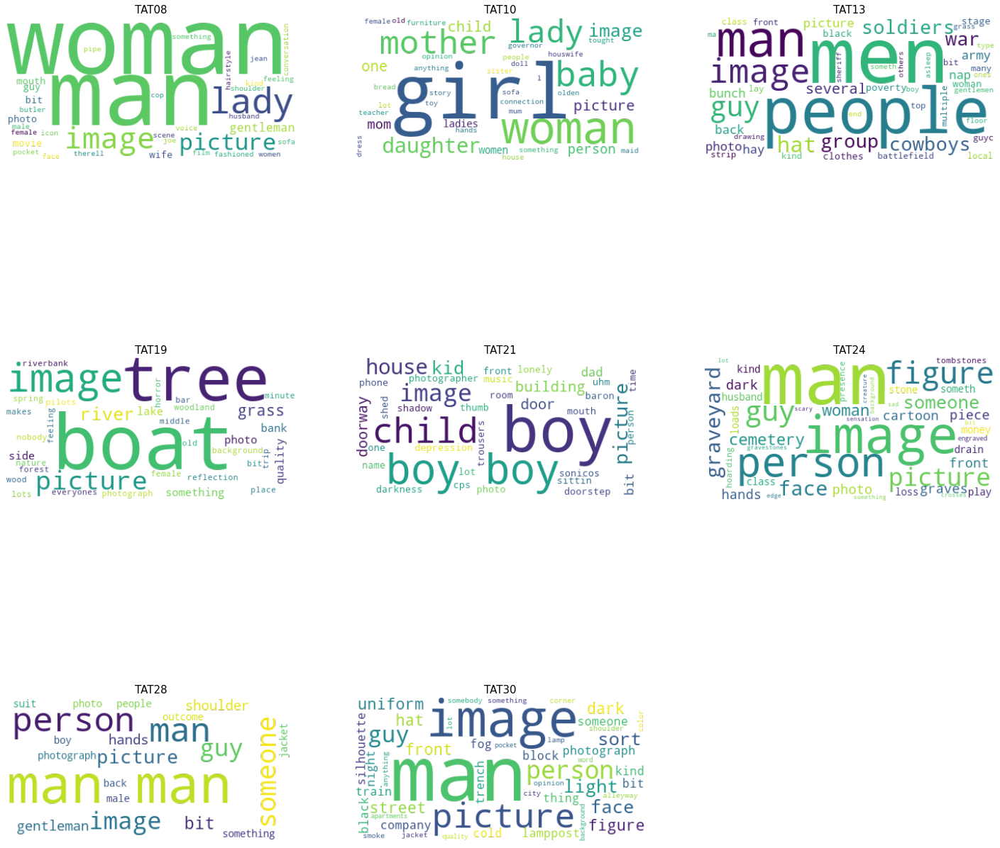

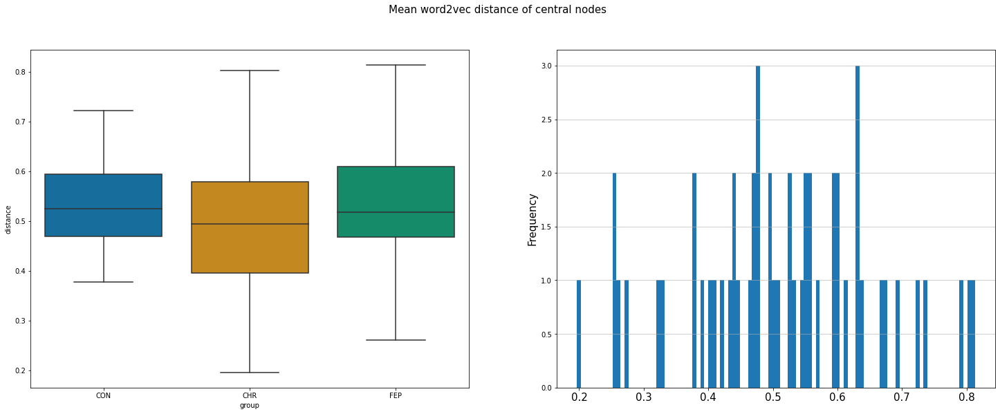

In [21]:
# ----------- Plot -----------
fig = plt.figure(figsize=(25, 9))
plt.suptitle('Mean word2vec distance of central nodes', fontsize=15)
ax = plt.subplot(1, 2, 1)
sns.boxplot(y='distance', x='group',
              data=oasis_avg,
              palette="colorblind",
              )
ax = plt.subplot(1, 2, 2)
plt.hist(oasis_avg.distance, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
output = op.join(output_figures, 'Hist_central_distances' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()


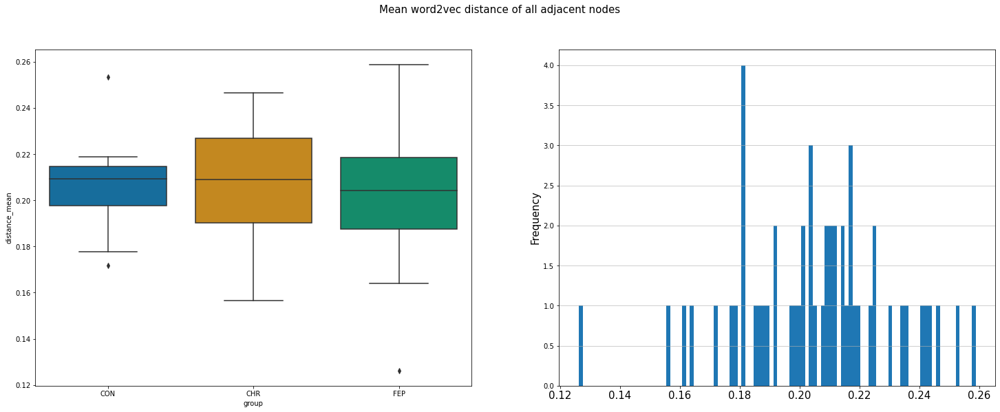

In [22]:
# ----------- Plot -----------
fig = plt.figure(figsize=(25, 9))
plt.suptitle('Mean word2vec distance of all adjacent nodes', fontsize=15)
ax = plt.subplot(1, 2, 1)
sns.boxplot(y='distance_mean', x='group',
              data=oasis_avg,
              palette="colorblind",
              )
ax = plt.subplot(1, 2, 2)
plt.hist(oasis_avg.distance_mean, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
output = op.join(output_figures, 'Hist_all_vector_distances' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()

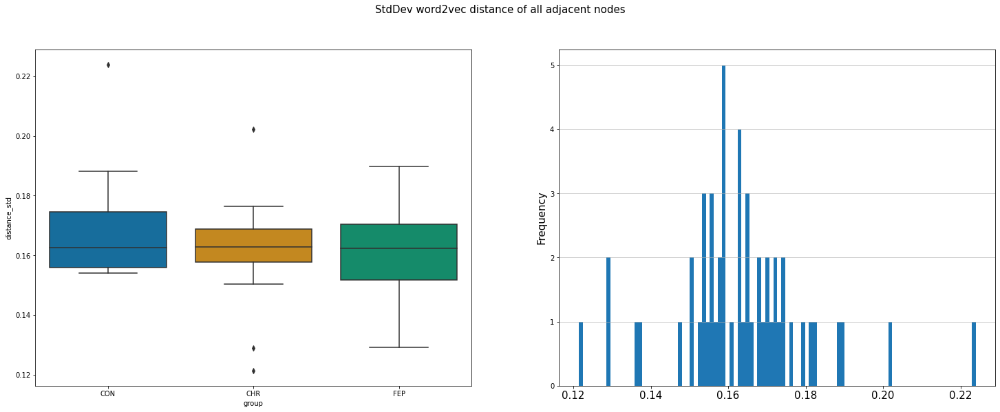

In [23]:
# ----------- Plot -----------
fig = plt.figure(figsize=(25, 9))
plt.suptitle('StdDev word2vec distance of all adjacent nodes', fontsize=15)
ax = plt.subplot(1, 2, 1)
sns.boxplot(y='distance_std', x='group',
              data=oasis_avg,
              palette="colorblind",
              )
ax = plt.subplot(1, 2, 2)
plt.hist(oasis_avg.distance_std, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
output = op.join(output_figures, 'Hist_all_vector_distances_std' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()

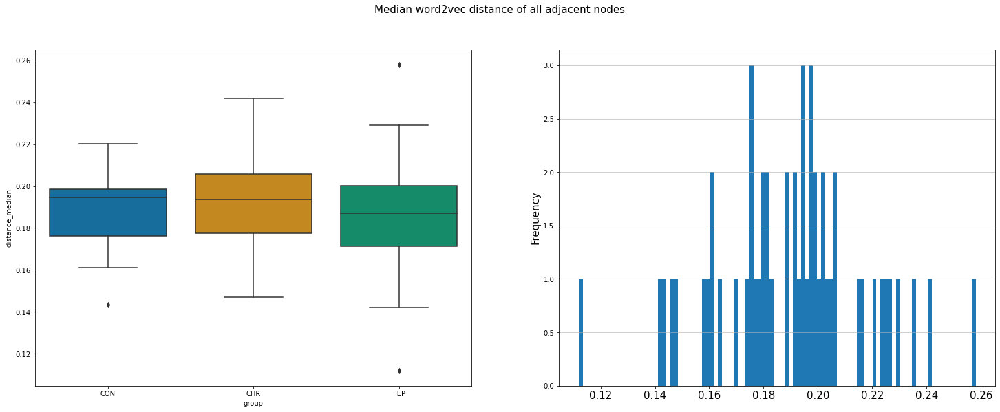

In [24]:
# ----------- Plot -----------
fig = plt.figure(figsize=(25, 9))
plt.suptitle('Median word2vec distance of all adjacent nodes', fontsize=15)
ax = plt.subplot(1, 2, 1)
sns.boxplot(y='distance_median', x='group',
              data=oasis_avg,
              palette="colorblind",
              )
ax = plt.subplot(1, 2, 2)
plt.hist(oasis_avg.distance_median, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
output = op.join(output_figures, 'Hist_all_vector_distances_median' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()

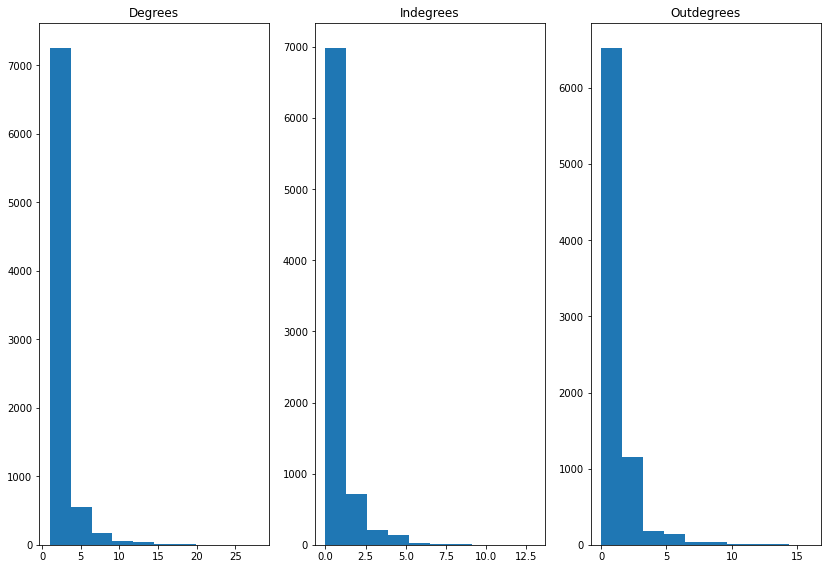

In [14]:
# --------------------- Degree distribution ---------------------------------------
#
degrees = []
in_degrees = []
out_degrees = []
for G in graphs:
    deg = [G.degree(n) for n in G.nodes()]
    degrees.extend(deg)
    outdeg = [G.out_degree(n) for n in G.nodes()]
    out_degrees.extend(outdeg)
    indeg = [G.in_degree(n) for n in G.nodes()]
    in_degrees.extend(indeg)

# Plot
fig = plt.figure(figsize=(14, 9.6))
ax = plt.subplot(1, 3, 1)
plt.hist(degrees)
plt.title('Degrees')
ax = plt.subplot(1, 3, 2)
plt.hist(in_degrees)
plt.title('Indegrees')
ax = plt.subplot(1, 3, 3)
plt.hist(out_degrees)
plt.title('Outdegrees')
# Save figure
output = op.join(output_figures, 'DegreeDistribution_' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

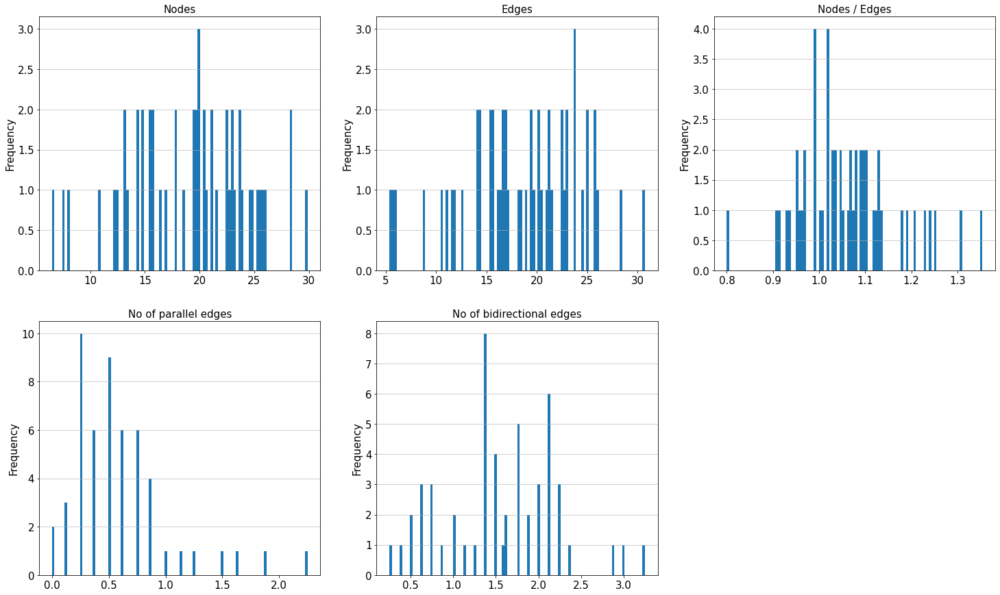

In [15]:

# ----------- Histogram: Nodes, Edges, Node-Edge ratio, Parallel edges -----------
# Set up the plot
fig = plt.figure(figsize=(25, 15))
# Nodes
ax = plt.subplot(2, 3, 1)
plt.hist(oasis_avg.nodes, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Nodes', fontsize=15)
# Edges
ax = plt.subplot(2, 3, 2)
plt.hist(oasis_avg.edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Edges', fontsize=15)
# Histogram Nodes/Edges ratio
ax = plt.subplot(2, 3, 3)
plt.hist(oasis_avg.nodes / oasis_avg.edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Nodes / Edges', fontsize=15)
# Parallel edges
ax = plt.subplot(2, 3, 4)
plt.hist(oasis_avg.parallel_edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('No of parallel edges', fontsize=15)
# Bidirectional edges
ax = plt.subplot(2, 3, 5)
plt.hist(oasis_avg.bidirectional_edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('No of bidirectional edges', fontsize=15)
# Save
output = op.join(output_figures, 'Hist_LCC-LSC_TAT' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

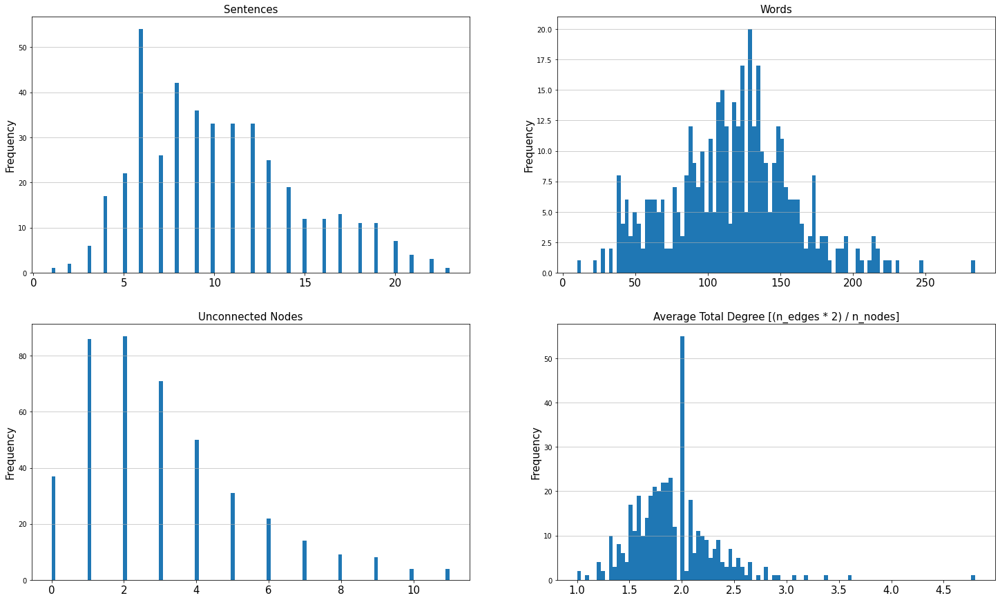

In [18]:

# ----------- Histogram -----------
# Sentences, Words, Unconnected Nodes, Average Total Degree,
fig = plt.figure(figsize=(25, 15))
# Sentences
ax = plt.subplot(2, 2, 1)
plt.hist(df.sentences, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Sentences', fontsize=15)
#
# Words
ax = plt.subplot(2, 2, 2)
plt.hist(df.words, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Words', fontsize=15)
#
# Unconnected Nodes
ax = plt.subplot(2, 2, 3)
plt.hist(df.unconnected, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Unconnected Nodes', fontsize=15)
#
# Average Total Degree
ax = plt.subplot(2, 2, 4)
plt.hist(df.average_total_degree, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Average Total Degree [(n_edges * 2) / n_nodes]', fontsize=15)
#
# Save figure
output = op.join(output_figures, 'Hist_Basics' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

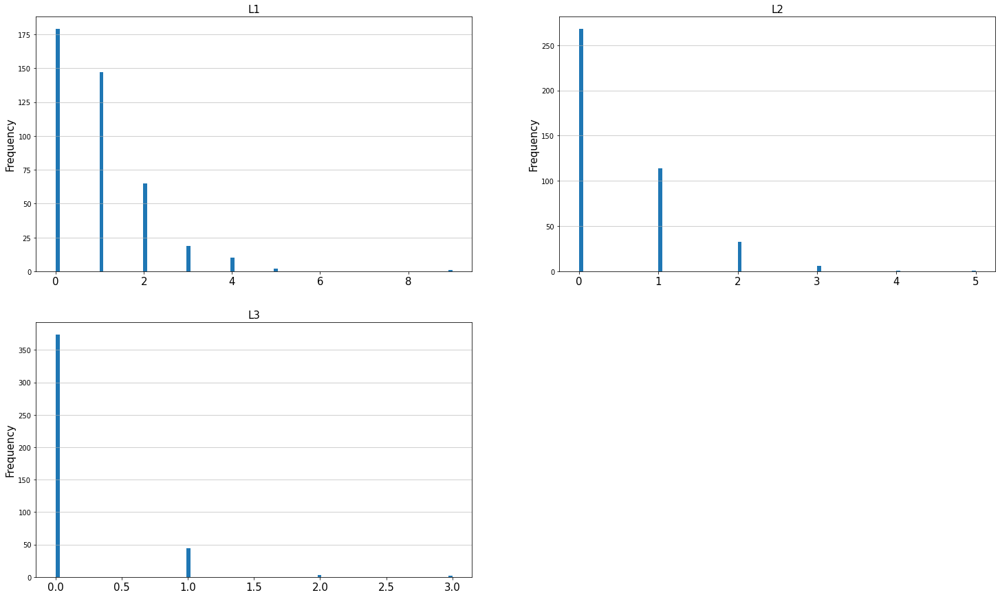

In [75]:
# ----------- Histogram -----------
# L1, L2, L3
fig = plt.figure(figsize=(25, 15))
# L1
ax = plt.subplot(2, 2, 1)
plt.hist(.L1, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('L1', fontsize=15)
#
# L2
ax = plt.subplot(2, 2, 2)
plt.hist(oa2, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('L2', fontsize=15)
#
# L3
ax = plt.subplot(2, 2, 3)
plt.hist(oasi bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('L3', fontsize=15)
#
# Save figure
output = op.join(output_figures, 'Hist_L' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

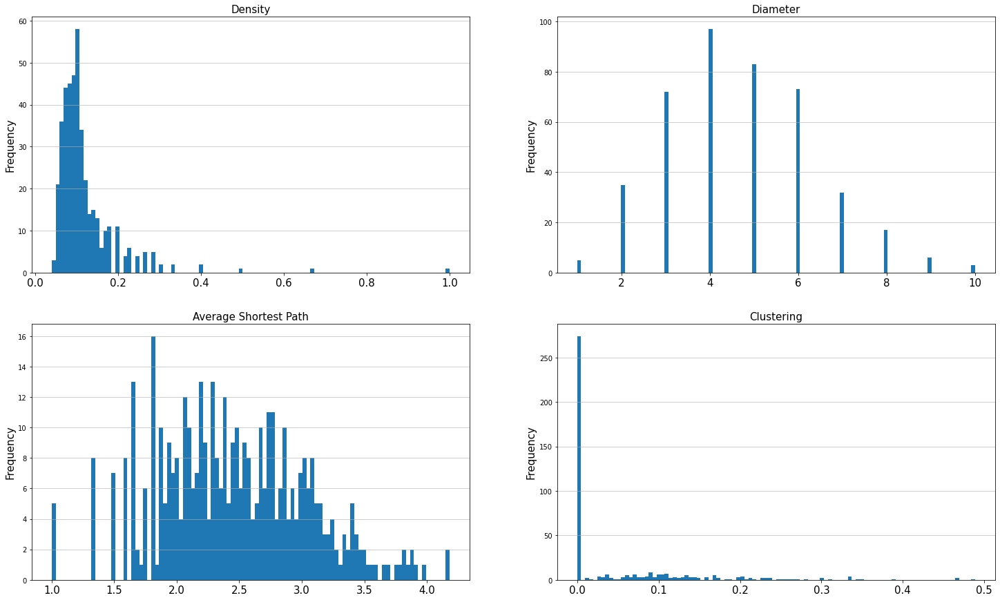

In [76]:
# ----------- Histogram -----------
# Density, Diameter, Average Shortest Path, Clustering,
fig = plt.figure(figsize=(25, 15))
# Density
ax = plt.subplot(2, 2, 1)
plt.hist(df.density, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Density', fontsize=15)
#
# Diameter
ax = plt.subplot(2, 2, 2)
plt.hist(df.diameter, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Diameter', fontsize=15)
#
# Average Shortest Path
ax = plt.subplot(2, 2, 3)
plt.hist(df.average_shortest_path, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Average Shortest Path', fontsize=15)
#
# Clustering
ax = plt.subplot(2, 2, 4)
plt.hist(df.clustering, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Clustering', fontsize=15)
#
# Save figure
output = op.join(output_figures, 'Hist_UndirectedGraphProperties' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

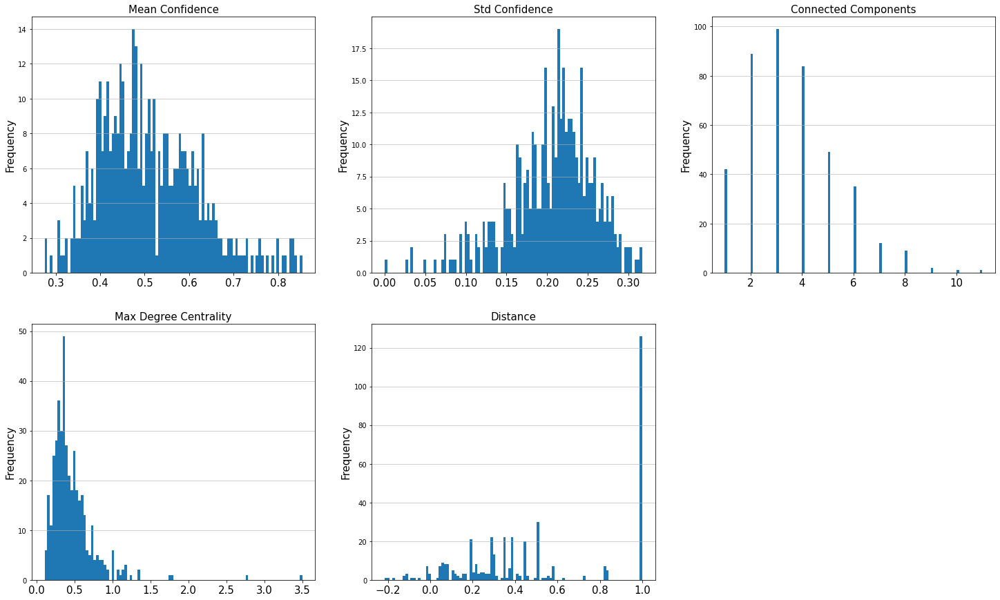

In [77]:

# ----------- Histogram -----------
# Mean Confidence, Std Confidence, Connected Components, Max Degree Centrality, Distance
fig = plt.figure(figsize=(25, 15))
# Mean Confidence
ax = plt.subplot(2, 3, 1)
plt.hist(df.mean_confidence[~np.isnan(df.mean_confidence)], bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Mean Confidence', fontsize=15)
#
# Std Confidence
ax = plt.subplot(2, 3, 2)
plt.hist(df.std_confidence[~np.isnan(df.std_confidence)], bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Std Confidence', fontsize=15)
#
# Connected Components
ax = plt.subplot(2, 3, 3)
plt.hist(df.connected_components, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Connected Components', fontsize=15)
#
# Max Degree Centrality
ax = plt.subplot(2, 3, 4)
plt.hist(df.max_degree_centrality, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Max Degree Centrality', fontsize=15)
#
# Distance
ax = plt.subplot(2, 3, 5)
plt.hist(df.distance[~np.isnan(df.distance)], bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Distance', fontsize=15)
# Save figure
output = op.join(output_figures, 'Hist_' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

In [17]:
# # ----------- stripplot for each group -----------
# # Mean Confidence, Std Confidence, Connected Components, Max Degree Centrality, Distance
# fig plt.figure(figsize=(25, 9))
# ax = p.subplot(2, 3, 1)
# sns.strilot(y='mean_confidence', x='group',
#             data=df,
#             palette="colorblind",
#               ax = plt.subplot, 3, 2)
# sns.stripplot(y='s_confidence', x='group',
#               data=d
#               palette=olorblind",
#               )
# ax = pltubplot(2, 3, 3)
# sns.stripplot(y='connected_cponents', x='group',
#               data=df,
#             palette="colorblin,
#               )
# ax = plt.subplot(23, 4)
# sns.strippt(y='max_degree_centrality x='group',
#               data=df,
#               palte="colorblind",
#             )
# ax = plt.subplot(2, 3, 5)
# snstripplot(y='disnce', x='group',
#             data=df,
#               palette="cololind",
#               )
# ax.set_xticklabels(frequent_words)

# output = op.join(outt_figures, 'Hist_group_noTicks' +
#                '_{0}'.format(str(datetime.date.today())))
# plt.savefig(output)
# plt.show(block=False)

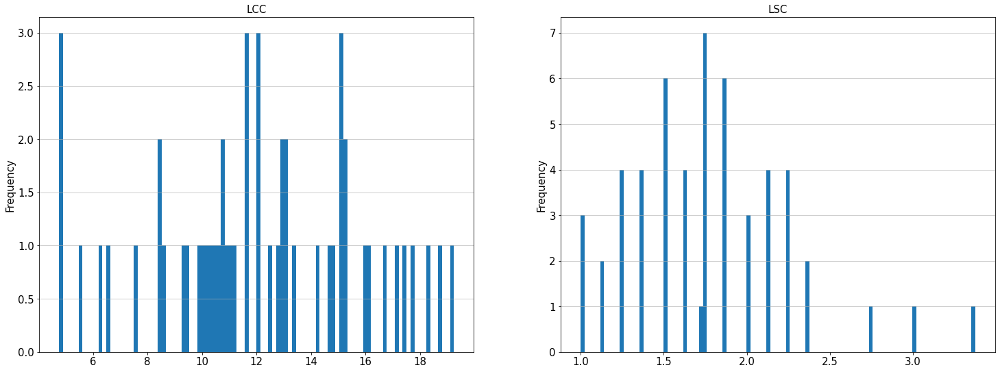

In [24]:

# ----------- Hist -----------
# LCC & LSC
fig = plt.figure(figsize=(25, 9))
# ---- LCC ----
# Set up the plot
ax = plt.subplot(1, 2, 1)
plt.hist(oasis_avg.lcc, bins=100)
plt.grid(axis='y', alpha=0.75)
# plt.xlabel('Nodes', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('LCC', fontsize=15)
# ---- LSC ----
# Set up the plot
ax = plt.subplot(1, 2, 2)
plt.hist(oasis_avg.lsc, bins=100)
plt.grid(axis='y', alpha=0.75)
# plt.xlabel('Nodes', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('LSC', fontsize=15)
output = op.join(output_figures, 'Hist_LCC-LSC' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

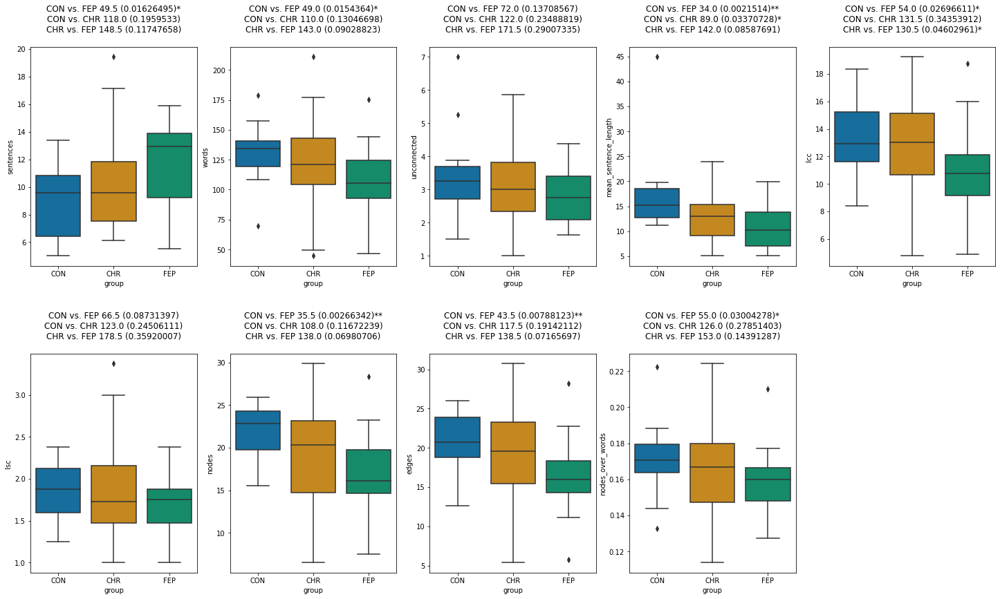

In [100]:
# ----------- boxplot for each group: Sentences, Words, Unconnected Nodes, Average Total Degree, LCC, LSC, Nodes, Edges, 
oasis_avg['nodes_over_words'] = oasis_avg.nodes/oasis_avg.words
oasis_avg['nodes_over_words']
variable_list = ['sentences', 'words', 'unconnected', 'mean_sentence_length', 'lcc', 'lsc', 'nodes', 'edges','nodes_over_words']
group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]

fig = plt.figure(figsize=(25, 14))
for v,variable in enumerate(variable_list):
    ax = plt.subplot(2, np.ceil(len(variable_list)/2), v+1)
    sns.boxplot(y=variable, x='group',
              data=oasis_avg,
              palette="colorblind",
              )
    results_mwu = []
    results_ttest = []
    stats_summary = ''
    for c, comb in enumerate(group_comparisons):
        a = oasis_avg.query('group == @comb[0]')[variable]
        b = oasis_avg.query('group == @comb[1]')[variable]
        results_mwu.append(scipy.stats.mannwhitneyu(a,b))
        results_ttest.append(scipy.stats.ttest_ind(a,b))
        # print('{0} vs. {1} {2} ({3})'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) ))
        if results_mwu[c][1] < 0.001:
            symbol = '***'
        elif results_mwu[c][1] < 0.01:
            symbol = '**'
        elif results_mwu[c][1] < 0.05:
            symbol = '*'
        else:
            symbol = ''
        stats_summary = stats_summary + '{0} vs. {1} {2} ({3}){4}\n'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8), symbol)
    plt.title(stats_summary)
plt.subplots_adjust(hspace = 0.4)
output = op.join(output_figures, 'Hist_{}' +
                 '_{}'.format('_'.join(variable_list), str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

sentences ShapiroResult(statistic=0.966036856174469, pvalue=0.14295326173305511)
words ShapiroResult(statistic=0.9846726655960083, pvalue=0.7368231415748596)
unconnected ShapiroResult(statistic=0.9416887164115906, pvalue=0.01312354113906622)
mean_sentence_length ShapiroResult(statistic=0.8013538122177124, pvalue=6.407344130821002e-07)
lcc ShapiroResult(statistic=0.9821994304656982, pvalue=0.6231693029403687)
lsc ShapiroResult(statistic=0.9438952207565308, pvalue=0.01617412269115448)
nodes ShapiroResult(statistic=0.9834076166152954, pvalue=0.6786981225013733)
edges ShapiroResult(statistic=0.9859191179275513, pvalue=0.7924327254295349)


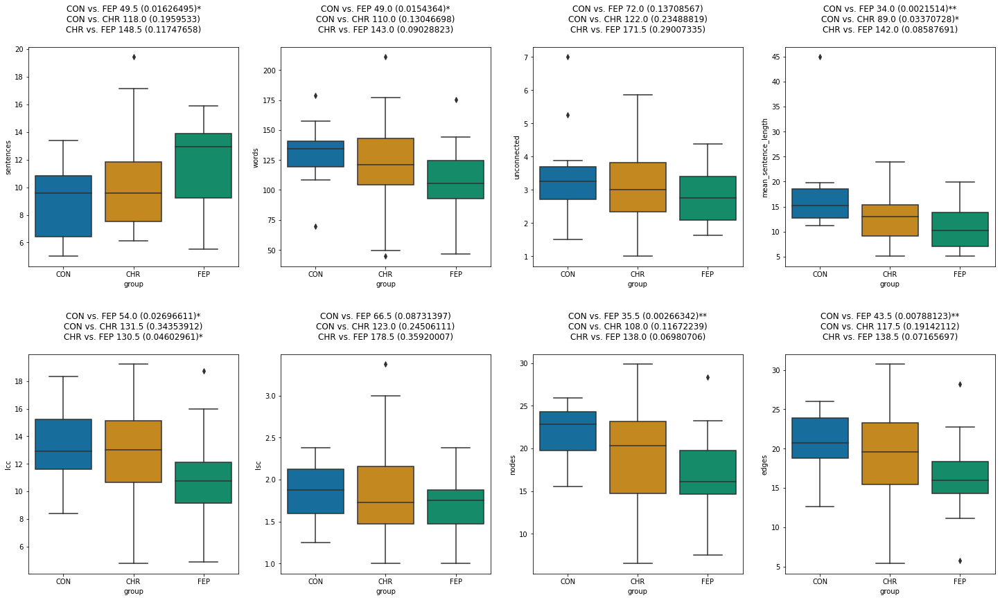

In [83]:
# ----------- boxplot for each group: Sentences, Words, Unconnected Nodes, Average Total Degree, LCC, LSC, Nodes, Edges, 
variable_list = ['sentences', 'words', 'unconnected', 'mean_sentence_length', 'lcc', 'lsc', 'nodes', 'edges']
group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]

fig = plt.figure(figsize=(25, 14))
for v,variable in enumerate(variable_list):
    ax = plt.subplot(2, np.ceil(len(variable_list)/2), v+1)
    sns.boxplot(y=variable, x='group',
              data=oasis_avg,
              palette="colorblind",
              )
    results_mwu = []
    results_ttest = []
    stats_summary = ''
    print(variable, scipy.stats.shapiro(oasis_avg[variable]))
    for c, comb in enumerate(group_comparisons):
        a = oasis_avg.query('group == @comb[0]')[variable]
        b = oasis_avg.query('group == @comb[1]')[variable]
        results_mwu.append(scipy.stats.mannwhitneyu(a,b))
        results_ttest.append(scipy.stats.ttest_ind(a,b))
        # print('{0} vs. {1} {2} ({3})'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) ))
        if results_mwu[c][1] < 0.001:
            symbol = '***'
        elif results_mwu[c][1] < 0.01:
            symbol = '**'
        elif results_mwu[c][1] < 0.05:
            symbol = '*'
        else:
            symbol = ''
        stats_summary = stats_summary + '{0} vs. {1} {2} ({3}){4}\n'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8), symbol)
    plt.title(stats_summary)
plt.subplots_adjust(hspace = 0.4)
output = op.join(output_figures, 'Hist_{}' +
                 '_{}'.format('_'.join(variable_list), str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

parallel_edges ShapiroResult(statistic=0.8459705710411072, pvalue=8.584291208535433e-06)
bidirectional_edges ShapiroResult(statistic=0.9749058485031128, pvalue=0.3371584415435791)
L1 ShapiroResult(statistic=0.9272220134735107, pvalue=0.00350615824572742)
L2 ShapiroResult(statistic=0.9664867520332336, pvalue=0.149485781788826)
L3 ShapiroResult(statistic=0.8337411880493164, pvalue=4.056787929584971e-06)
connected_components ShapiroResult(statistic=0.9762471914291382, pvalue=0.3810194134712219)
max_degree_centrality ShapiroResult(statistic=0.7767585515975952, pvalue=1.770398938560902e-07)
density ShapiroResult(statistic=0.6736642718315125, pvalue=1.7772594507192707e-09)


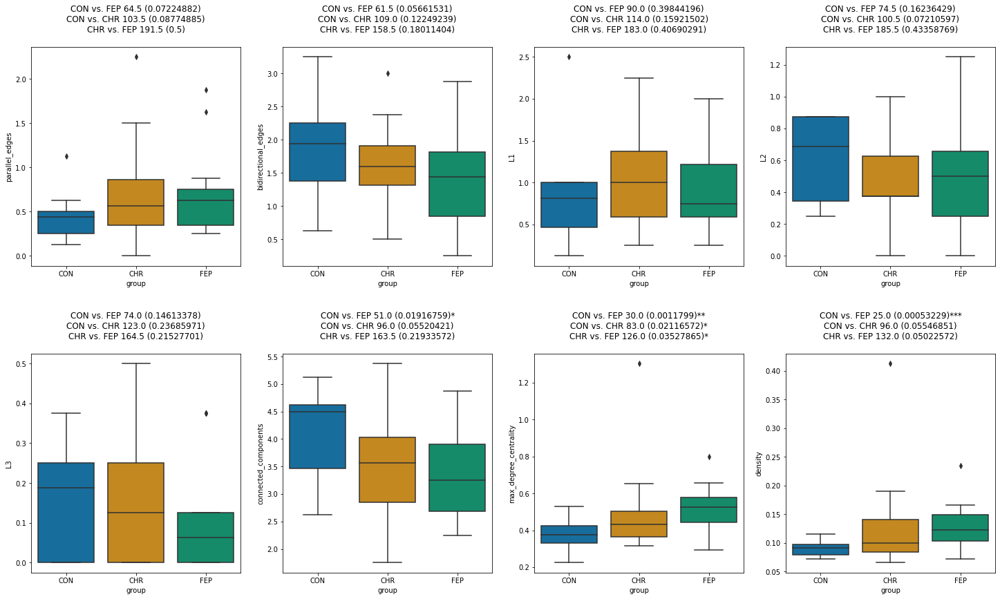

In [84]:
# ----------- boxplot for each group: Sentences, Words, Unconnected Nodes, Average Total Degree, LCC, LSC, Nodes, Edges, 
# variable_list = ['sentences', 'words', 'unconnected', 'average_total_degree', 'lcc', 'lsc', 'nodes', 'edges']
variable_list = [ 'parallel_edges', 'bidirectional_edges', 'L1', 'L2', 'L3', 'connected_components', 'max_degree_centrality', 'density']



group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]

fig = plt.figure(figsize=(25, 14))
for v,variable in enumerate(variable_list):
    ax = plt.subplot(2, np.ceil(len(variable_list)/2), v+1)
    sns.boxplot(y=variable, x='group',
              data=oasis_avg,
              palette="colorblind",
              )
    results_mwu = []
    results_ttest = []
    stats_summary = ''
    # print(variable, scipy.stats.shapiro(oasis_avg[variable]))
    for c, comb in enumerate(group_comparisons):
        a = oasis_avg.query('group == @comb[0]')[variable]
        b = oasis_avg.query('group == @comb[1]')[variable]
        results_mwu.append(scipy.stats.mannwhitneyu(a,b))
        results_ttest.append(scipy.stats.ttest_ind(a,b))
        # print('{0} vs. {1} {2} ({3})'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) ))
        if results_mwu[c][1] < 0.001:
            symbol = '***'
        elif results_mwu[c][1] < 0.01:
            symbol = '**'
        elif results_mwu[c][1] < 0.05:
            symbol = '*'
        else:
            symbol = ''
        stats_summary = stats_summary + '{0} vs. {1} {2} ({3}){4}\n'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8), symbol)
    plt.title(stats_summary)
plt.subplots_adjust(hspace = 0.4)
output = op.join(output_figures, 'Hist_{}' +
                 '_{}'.format('_'.join(variable_list), str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)



In [89]:
df.connected_components

0      5
1      6
2      3
3      5
4      4
      ..
418    1
419    3
420    3
421    4
422    3
Name: connected_components, Length: 415, dtype: int64

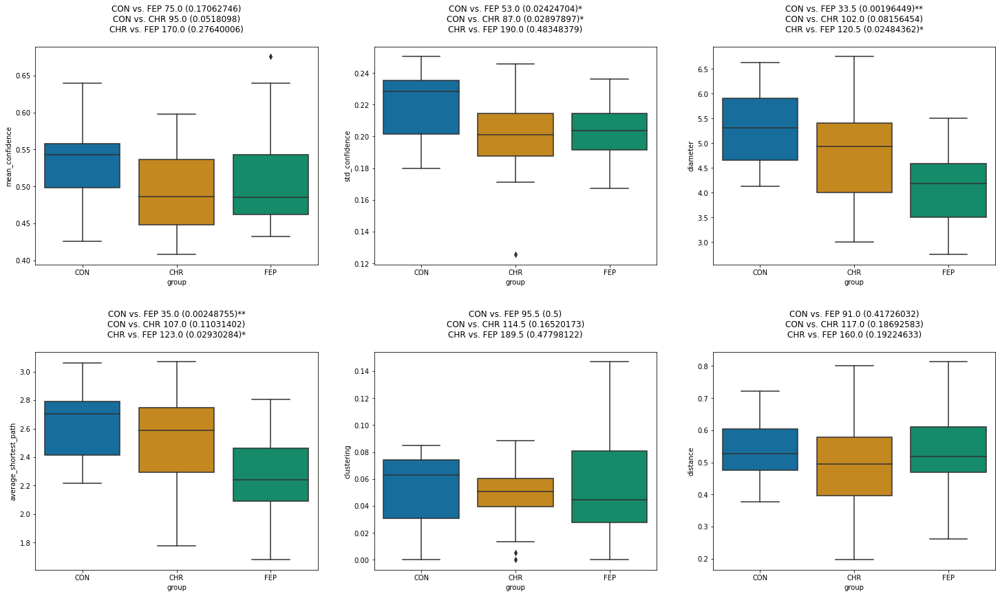

In [85]:
variable_list = ['mean_confidence', 'std_confidence',  'diameter', 'average_shortest_path', 'clustering', 'distance']


group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]

fig = plt.figure(figsize=(25, 14))
for v,variable in enumerate(variable_list):
    ax = plt.subplot(2, np.ceil(len(variable_list)/2), v+1)
    sns.boxplot(y=variable, x='group',
              data=oasis_avg,
              palette="colorblind",
              )
    results_mwu = []
    results_ttest = []
    stats_summary = ''
    for c, comb in enumerate(group_comparisons):
        a = oasis_avg.query('group == @comb[0]')[variable]
        b = oasis_avg.query('group == @comb[1]')[variable]
        results_mwu.append(scipy.stats.mannwhitneyu(a,b))
        results_ttest.append(scipy.stats.ttest_ind(a,b))
        # print('{0} vs. {1} {2} ({3})'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) ))
        if results_mwu[c][1] < 0.001:
            symbol = '***'
        elif results_mwu[c][1] < 0.01:
            symbol = '**'
        elif results_mwu[c][1] < 0.05:
            symbol = '*'
        else:
            symbol = ''
        stats_summary = stats_summary + '{0} vs. {1} {2} ({3}){4}\n'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8), symbol)
    plt.title(stats_summary)
plt.subplots_adjust(hspace = 0.4)
output = op.join(output_figures, 'Hist_{}' +
                 '_{}'.format('_'.join(variable_list), str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)




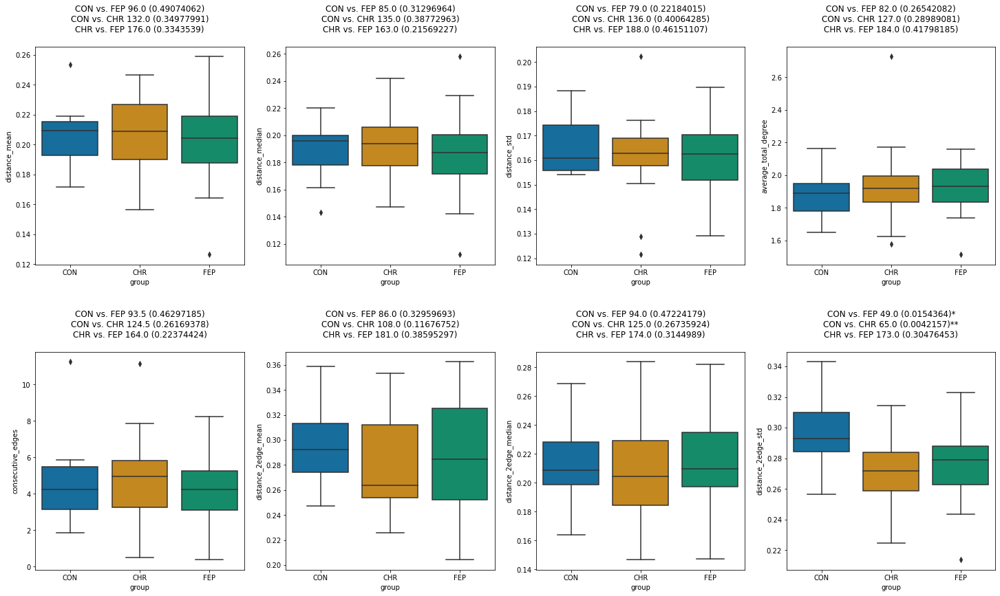

In [86]:
variable_list = ['distance_mean', 'distance_median', 'distance_std', 'average_total_degree', 'consecutive_edges', 'distance_2edge_mean','distance_2edge_median','distance_2edge_std']
# variable_list = [ 'average_total_degree', 'consecutive_edges']

group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]

fig = plt.figure(figsize=(25, 14))
for v,variable in enumerate(variable_list):
    ax = plt.subplot(2, np.ceil(len(variable_list)/2), v+1)
    sns.boxplot(y=variable, x='group',
              data=oasis_avg,
              palette="colorblind",
              )
    results_mwu = []
    results_ttest = []
    stats_summary = ''
    for c, comb in enumerate(group_comparisons):
        a = oasis_avg.query('group == @comb[0]')[variable]
        b = oasis_avg.query('group == @comb[1]')[variable]
        results_mwu.append(scipy.stats.mannwhitneyu(a,b))
        results_ttest.append(scipy.stats.ttest_ind(a,b))
        # print('{0} vs. {1} {2} ({3})'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) ))
        if results_mwu[c][1] < 0.001:
            symbol = '***'
        elif results_mwu[c][1] < 0.01:
            symbol = '**'
        elif results_mwu[c][1] < 0.05:
            symbol = '*'
        else:
            symbol = ''
        stats_summary = stats_summary + '{0} vs. {1} {2} ({3}){4}\n'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8), symbol)
    plt.title(stats_summary)
plt.subplots_adjust(hspace = 0.4)
output = op.join(output_figures, 'Hist_{}' +
                 '_{}'.format('_'.join(variable_list), str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)



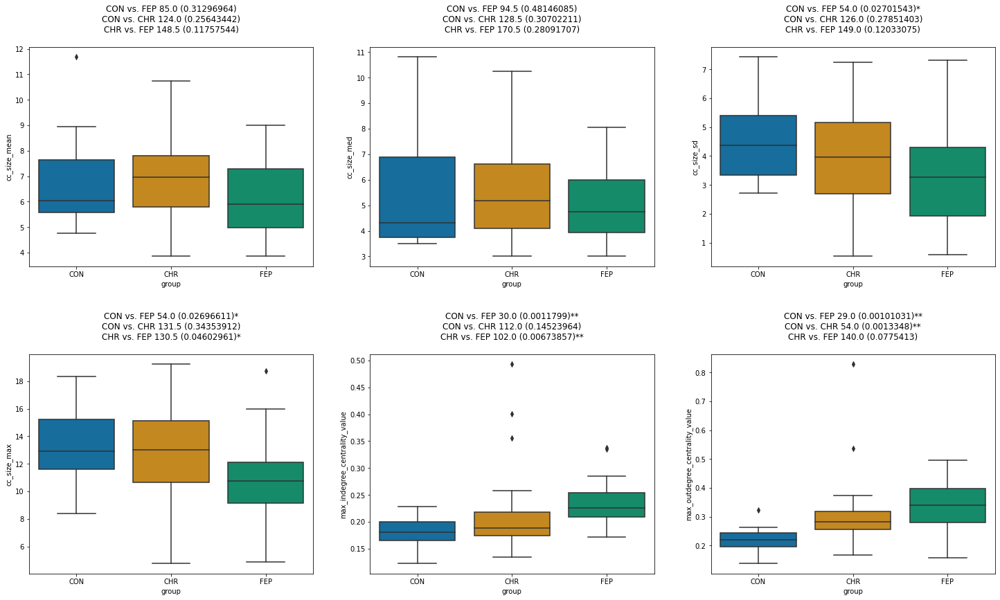

In [87]:
variable_list = ['cc_size_mean','cc_size_med','cc_size_sd','cc_size_max', 'max_indegree_centrality_value','max_outdegree_centrality_value']
oasis_avg = oasis_avg

group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]

fig = plt.figure(figsize=(25, 14))
for v,variable in enumerate(variable_list):
    ax = plt.subplot(2, np.ceil(len(variable_list)/2), v+1)
    sns.boxplot(y=variable, x='group',
              data=oasis_avg,
              palette="colorblind",
              )
    results_mwu = []
    results_ttest = []
    stats_summary = ''
    for c, comb in enumerate(group_comparisons):
        a = oasis_avg.query('group == @comb[0]')[variable]
        b = oasis_avg.query('group == @comb[1]')[variable]
        results_mwu.append(scipy.stats.mannwhitneyu(a,b))
        results_ttest.append(scipy.stats.ttest_ind(a,b))
        # print('{0} vs. {1} {2} ({3})'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) ))
        if results_mwu[c][1] < 0.001:
            symbol = '***'
        elif results_mwu[c][1] < 0.01:
            symbol = '**'
        elif results_mwu[c][1] < 0.05:
            symbol = '*'
        else:
            symbol = ''
        stats_summary = stats_summary + '{0} vs. {1} {2} ({3}){4}\n'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8), symbol)
    plt.title(stats_summary)
plt.subplots_adjust(hspace = 0.4)
output = op.join(output_figures, 'Hist_{}' +
                 '_{}'.format('_'.join(variable_list), str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)




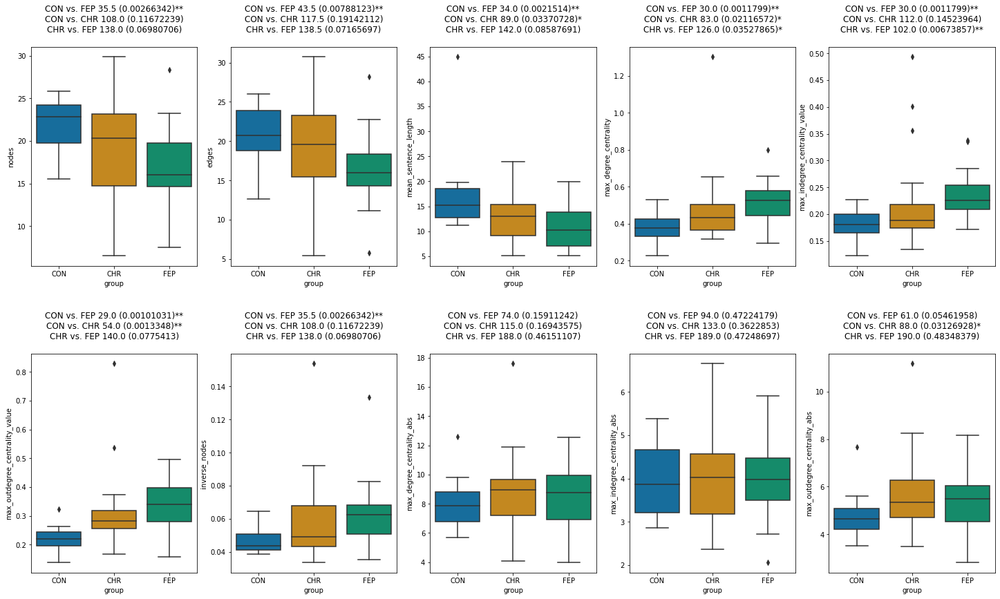

In [102]:

# variable_list = ['nodes','edges','mean_sentence_length','max_degree_centrality', 'max_indegree_centrality_value','max_outdegree_centrality_value', 'max_degree_centrality_abs']

# variable_list = ['nodes','edges','mean_sentence_length','max_degree_centrality', 'max_indegree_centrality_value','max_outdegree_centrality_value', 'max_degree_centrality_abs', 'max_indegree_centrality_value_abs','max_outdegree_centrality_value_abs']
variable_list = ['nodes','edges','mean_sentence_length','max_degree_centrality', 'max_indegree_centrality_value','max_outdegree_centrality_value', 'inverse_nodes', 'max_degree_centrality_abs', 'max_indegree_centrality_abs', 'max_outdegree_centrality_abs']

group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]

fig = plt.figure(figsize=(25, 14))
for v,variable in enumerate(variable_list):
    ax = plt.subplot(2, np.ceil(len(variable_list)/2), v+1)
    sns.boxplot(y=variable, x='group',
              data=oasis_avg,
              palette="colorblind",
              )
    results_mwu = []
    results_ttest = []
    stats_summary = ''
    for c, comb in enumerate(group_comparisons):
        a = oasis_avg.query('group == @comb[0]')[variable]
        b = oasis_avg.query('group == @comb[1]')[variable]
        results_mwu.append(scipy.stats.mannwhitneyu(a,b))
        results_ttest.append(scipy.stats.ttest_ind(a,b))
        # print('{0} vs. {1} {2} ({3})'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) ))
        if results_mwu[c][1] < 0.001:
            symbol = '***'
        elif results_mwu[c][1] < 0.01:
            symbol = '**'
        elif results_mwu[c][1] < 0.05:
            symbol = '*'
        else:
            symbol = ''
        stats_summary = stats_summary + '{0} vs. {1} {2} ({3}){4}\n'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8), symbol)
    plt.title(stats_summary)
plt.subplots_adjust(hspace = 0.4)
output = op.join(output_figures, 'Hist_{}' +
                 '_{}'.format('_'.join(variable_list), str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)



In [ ]:
tat_list = ['nodes','edges','mean_sentence_length','max_degree_centrality', 'max_indegree_centrality_value','max_outdegree_centrality_value', 'inverse_nodes', 'max_degree_centrality_abs', 'max_indegree_centrality_abs', 'max_outdegree_centrality_abs']

group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]

fig = plt.figure(figsize=(25, 14))
for v,tat in enumerate(df.):
    ax = plt.subplot(2, np.ceil(len(tat_list)/2), v+1)
    sns.boxplot(y=tat, x='group',
              data=oasis_avg,
              palette="colorblind",
              )
    results_mwu = []
    results_ttest = []
    stats_summary = ''
    for c, comb in enumerate(group_comparisons):
        a = oasis_avg.query('group == @comb[0]')[tat]
        b = oasis_avg.query('group == @comb[1]')[tat]
        results_mwu.append(scipy.stats.mannwhitneyu(a,b))
        results_ttest.append(scipy.stats.ttest_ind(a,b))
        # print('{0} vs. {1} {2} ({3})'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) ))
        if results_mwu[c][1] < 0.001:
            symbol = '***'
        elif results_mwu[c][1] < 0.01:
            symbol = '**'
        elif results_mwu[c][1] < 0.05:
            symbol = '*'
        else:
            symbol = ''
        stats_summary = stats_summary + '{0} vs. {1} {2} ({3}){4}\n'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8), symbol)
    plt.title(stats_summary)
plt.subplots_adjust(hspace = 0.4)
output = op.join(output_figures, 'Hist_{}' +
                 '_{}'.format('_'.join(tat_list), str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

In [39]:


variable_list = ['sentences', 'words', 'unconnected', 'average_total_degree', 'lcc', 'lsc', 'nodes', 'edges']
group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]
results_norm = []
for variable in variable_list:
    print('\n---- {} ----'.format(variable))
    results_norm.append(scipy.stats.normaltest(oasis_avg[variable]))
    results_mwu = []
    results_ttest = []
    stats_summary = ''
    for c, comb in enumerate(group_comparisons):
        a = oasis_avg.query('group == @comb[0]')[variable]
        b = oasis_avg.query('group == @comb[1]')[variable]
        results_mwu.append(scipy.stats.mannwhitneyu(a,b))
        results_ttest.append(scipy.stats.ttest_ind(a,b))
        # print('{0} vs. {1} {2} ({3})'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) ))
        stats_summary = stats_summary + '{0} vs. {1} {2} ({3})\n'.format(comb[0], comb[1], round(results_mwu[c][0],8), round(results_mwu[c][1],8) )
    print(stats_summary)
    



---- sentences ----
CON vs. FEP 49.5 (0.00888459)
CON vs. CHR 118.0 (0.11631723)
CHR vs. FEP 148.5 (0.11747658)


---- words ----
CON vs. FEP 65.0 (0.04567331)
CON vs. CHR 134.0 (0.24698565)
CHR vs. FEP 143.0 (0.09028823)


---- unconnected ----
CON vs. FEP 88.0 (0.24788908)
CON vs. CHR 145.0 (0.36895393)
CHR vs. FEP 171.5 (0.29007335)


---- average_total_degree ----
CON vs. FEP 82.0 (0.17288205)
CON vs. CHR 127.0 (0.1822812)
CHR vs. FEP 184.0 (0.41798185)


---- lcc ----
CON vs. FEP 70.0 (0.07083299)
CON vs. CHR 155.0 (0.49365199)
CHR vs. FEP 130.5 (0.04602961)


---- lsc ----
CON vs. FEP 82.0 (0.17105585)
CON vs. CHR 146.5 (0.38698707)
CHR vs. FEP 178.5 (0.35920007)


---- nodes ----
CON vs. FEP 50.5 (0.0100343)
CON vs. CHR 131.0 (0.21781687)
CHR vs. FEP 138.0 (0.06980706)


---- edges ----
CON vs. FEP 58.5 (0.02421228)
CON vs. CHR 140.5 (0.31657481)
CHR vs. FEP 138.5 (0.07165697)



In [37]:
oasis_avg.columns[1:-2]

Index(['words', 'sentences', 'nodes', 'edges', 'unconnected',
       'average_total_degree', 'parallel_edges', 'bidirectional_edges', 'lsc',
       'lcc', 'L1', 'L2', 'L3', 'cc_size_mean', 'cc_size_med', 'cc_size_sd',
       'cc_size_max', 'connected_components', 'max_degree_centrality',
       'max_indegree_centrality_value', 'max_outdegree_centrality_value',
       'mean_sentence_length', 'mean_confidence', 'std_confidence', 'density',
       'diameter', 'average_shortest_path', 'clustering', 'consecutive_edges',
       'distance', 'distance_mean', 'distance_median', 'distance_std',
       'distance_2edge_mean', 'distance_2edge_median', 'distance_2edge_std'],
      dtype='object')

In [38]:
variable_list = oasis_avg.columns[1:-2]
group_comparisons = [('CON', 'FEP'), ('CON', 'CHR'), ('CHR', 'FEP')]
for variable in variable_list:
    print('\n---- {} ----'.format(variable))
    print(scipy.stats.shapiro(oasis_avg[variable]))
    print('\n')
    # for comb in group_comparisons:
    #     print(comb)
    #     # T-test
    #     a = oasis_avg.query('group == @comb[0]')[variable]
    #     b = oasis_avg.query('group == @comb[1]')[variable]
    #     print('{}'.format(scipy.stats.ttest_ind(a,b)))
    #     print(scipy.stats.mannwhitneyu(a,b))
    #     print('\n')


---- words ----
ShapiroResult(statistic=0.9832251071929932, pvalue=0.6587012410163879)



---- sentences ----
ShapiroResult(statistic=0.9790232181549072, pvalue=0.47232407331466675)



---- nodes ----
ShapiroResult(statistic=0.9809175729751587, pvalue=0.5529492497444153)



---- edges ----
ShapiroResult(statistic=0.9803574681282043, pvalue=0.528383731842041)



---- unconnected ----
ShapiroResult(statistic=0.9463760256767273, pvalue=0.01885732263326645)



---- average_total_degree ----
ShapiroResult(statistic=0.9225195050239563, pvalue=0.0020816985052078962)



---- parallel_edges ----
ShapiroResult(statistic=0.854653000831604, pvalue=1.2670234355027787e-05)



---- bidirectional_edges ----
ShapiroResult(statistic=0.9744037389755249, pvalue=0.31017813086509705)



---- lsc ----
ShapiroResult(statistic=0.9460824728012085, pvalue=0.018325775861740112)



---- lcc ----
ShapiroResult(statistic=0.9783183336257935, pvalue=0.44426918029785156)



---- L1 ----
ShapiroResult(statistic=0.92434

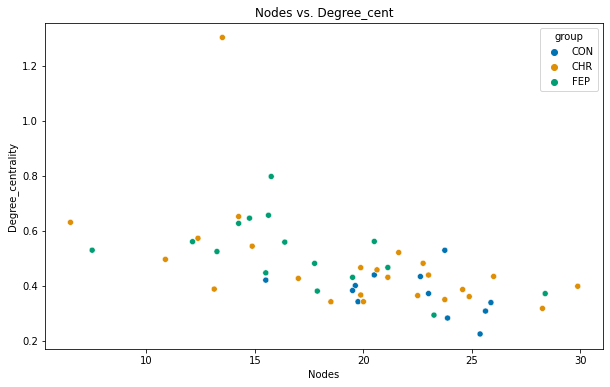

In [93]:

# ----------- Plot nodes vs edges -----------
fig, ax = plt.subplots(figsize=(10, 6))
groups = oasis_avg.group.unique()

sns.scatterplot(data=oasis_avg, x="nodes", y="max_degree_centrality", hue="group", palette='colorblind')

plt.title('Nodes vs. Degree_cent')
plt.xlabel('Nodes')
plt.ylabel('Degree_centrality')
output = op.join(output_figures, 'Nodes_vs_Degree_cent' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

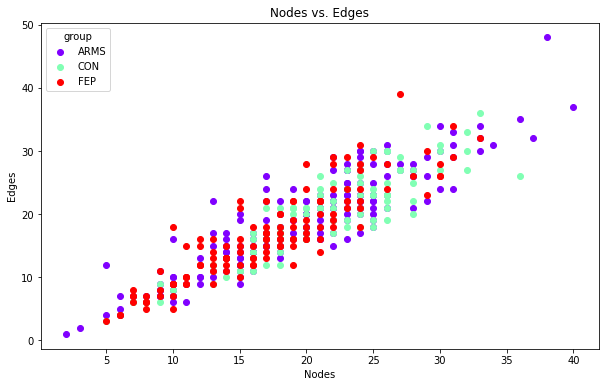

In [81]:

# ----------- Plot nodes vs edges -----------
fig, ax = plt.subplots(figsize=(10, 6))
groups = df.group.unique()
colors = cm.rainbow(np.linspace(0, 1, len(groups)))
for t, c in zip(groups, colors):
    plt.scatter(df[df.group == t].nodes, df[df.group == t].edges, color=c, label=t)

ax.legend(title="group")
plt.title('Nodes vs. Edges')
plt.xlabel('Nodes')
plt.ylabel('Edges')
output = op.join(output_figures, 'Nodes_vs_Edges' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

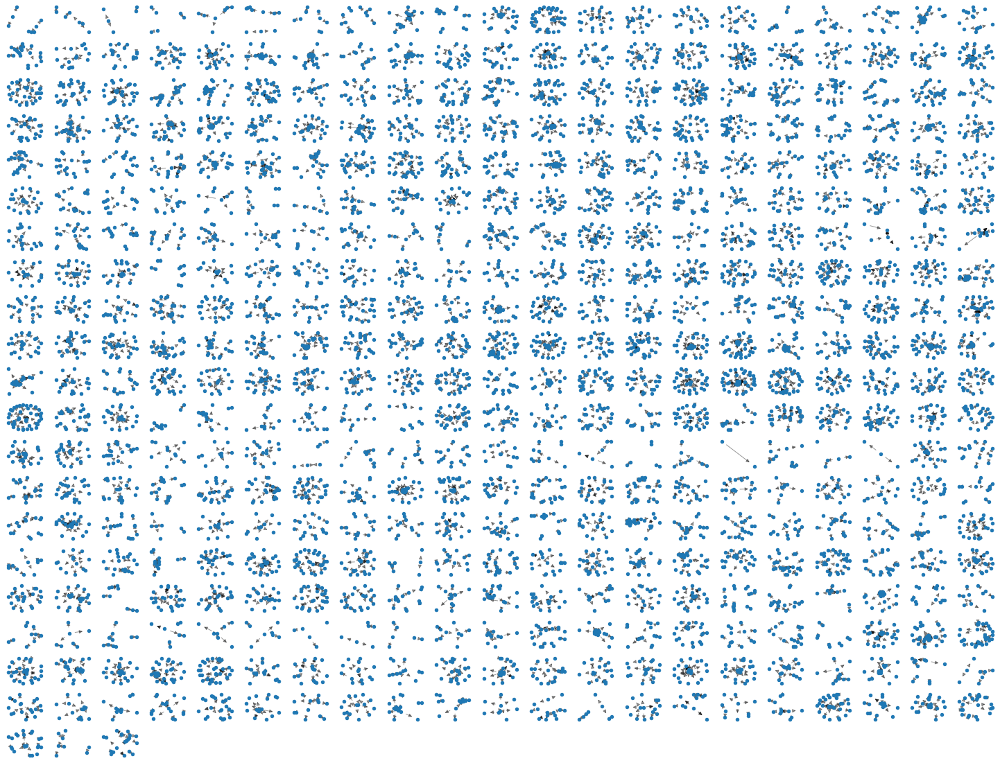

In [85]:

# --------------------- Raster Plot of all Graphs - with Groups colored ---------------------------------------
fig = plt.figure(figsize=(25.6, 20))
for g, G in enumerate(df_sorted.graph):
    ax = plt.subplot(np.ceil(np.sqrt(len(graphs))), np.ceil(np.sqrt(len(graphs))), g + 1)
    pos = nx.spring_layout(G)
    plt.axis("off")
    nx.draw_networkx_nodes(G, pos, node_size=20)
    nx.draw_networkx_edges(G, pos, alpha=0.4)

# --- Optional: Save plot --- 
output = op.join(output_figures, 'GraphsRaster' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()

In [67]:
df_sorted = df
df_sorted['graph'] = graphs
df_sorted.sort_values(by=['group', 'subj'], ascending=[True, True], inplace=True, ignore_index=True)
# df_sorted.head()

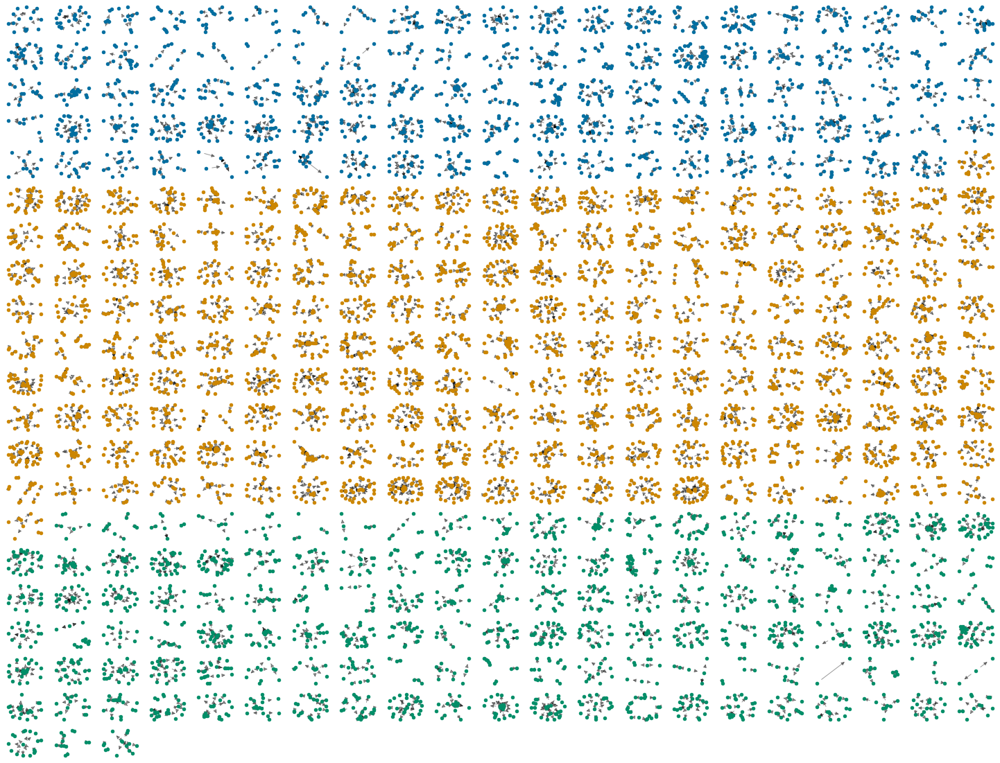

In [68]:

# --------------------- Raster Plot of all Graphs - with Groups colored ---------------------------------------
fig = plt.figure(figsize=(25.6, 20))
for g, G in enumerate(df_sorted.graph):
    ax = plt.subplot(np.ceil(np.sqrt(len(graphs))), np.ceil(np.sqrt(len(graphs))), g + 1)
    pos = nx.spring_layout(G)
    plt.axis("off")
    if df_sorted.group[g] == 'CHR':
        c='#CC8601'
    elif df_sorted.group[g] == 'FEP':
        c='#008E68'
    elif df_sorted.group[g] == 'CON':
        c='#006EA0'
    nx.draw_networkx_nodes(G, pos, node_size=20, node_color=c)
    nx.draw_networkx_edges(G, pos, alpha=0.4)

# --- Optional: Save plot --- 
output = op.join(output_figures, 'GraphsRaster_ColoredPatients' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()